In [2]:
!pip install pytube

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 2.7 MB/s eta 0:00:00


In [1]:
from pytube import YouTube

url = 'https://www.youtube.com/shorts/68oW7VTV4BQ'
yt = YouTube(url)

print("Title:", yt.title)
print("Rating:", yt.rating)
print("Views:", yt.views)
print("Author:", yt.author)
print("Duration:", yt.length)

Title: Why Dont Machine learning models have a secret 🤔 #genai #machinelearning
Rating: None
Views: 10190
Author: Krish Naik
Duration: 37


In [2]:
import cv2
import numpy as np

In [3]:
!apt install -y caffe-cuda

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package caffe-cuda


In [4]:
url = 'https://www.youtube.com/shorts/68oW7VTV4BQ'
yt = YouTube(url)
play = yt.streams.get_highest_resolution()

print("Video Title:", yt.title)
print("Video Resolution:", play.resolution)
print("Video Length (seconds):", yt.length)
print("Video Author:", yt.author)
print("Video Views:", yt.views)


Video Title: Why Dont Machine learning models have a secret 🤔 #genai #machinelearning
Video Resolution: 720p
Video Length (seconds): 37
Video Author: Krish Naik
Video Views: 10190


In [5]:
#cap = cv2.VideoCapture(0)  #if you are using WebCam
cap = cv2.VideoCapture(play.url)   # reading an online video URL

In [6]:
cap.set(3, 480)  # set width of the video frame
cap.set(4, 640)

False

In [7]:
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
age_list = ['(0, 2)', '(4, 6)', '(8, 12)', '(15, 20)', '(25, 32)', '(38, 43)', '(48, 53)', '(60, 100)']
gender_list = ['Male', 'Female']

In [8]:
from pathlib import Path
import os

cwd = Path.cwd() / "datasets/age_gender_models"

In [9]:
def load_caffe_models():
  age_net = cv2.dnn.readNetFromCaffe(os.path.join(cwd, 'deploy_age.prototxt'), os.path.join(cwd, 'age_net.caffemodel'))

  gender_net = cv2.dnn.readNetFromCaffe(os.path.join(cwd, 'deploy_gender.prototxt'), os.path.join(cwd, 'gender_net.caffemodel'))
  return( age_net, gender_net )

In [10]:
from google.colab.patches import cv2_imshow

def video_detector(age_net, gender_net):
  font = cv2.FONT_HERSHEY_SIMPLEX

  while True:
    ret, image = cap.read()
    face_cascade = cv2.CascadeClassifier(os.path.join(cwd, 'haarcascade_frontalface_alt.xml'))

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5)

    if len(faces) > 0:
        print("Found {} faces".format(str(len(faces))))

    for x, y, w, h in faces:
        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 255, 0), 2)

        # get face
        face_img = image[y:y + h, x:x + w].copy()
        blob = cv2.dnn.blobFromImage(face_img, 1, (227, 227), MODEL_MEAN_VALUES, swapRB=False)

        # Predict Gender
        gender_net.setInput(blob)
        gender_preds = gender_net.forward()
        gender = gender_list[gender_preds[0].argmax()]
        print("Gender: " + gender)

        # Predict Age
        age_net.setInput(blob)
        age_preds = age_net.forward()
        age = age_list[age_preds[0].argmax()]
        print("Age Range: " + age)

        overlay_text = "%s %s" % (gender, age)
        cv2.putText(image, overlay_text, (x, y), font, 1, (255, 255, 255), 2, cv2.LINE_AA)

    cv2_imshow(image)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

  # do a bit of cleanup
  cap.release()
  cv2.destroyAllWindows()

Found 1 faces
Gender: Male
Age Range: (25, 32)


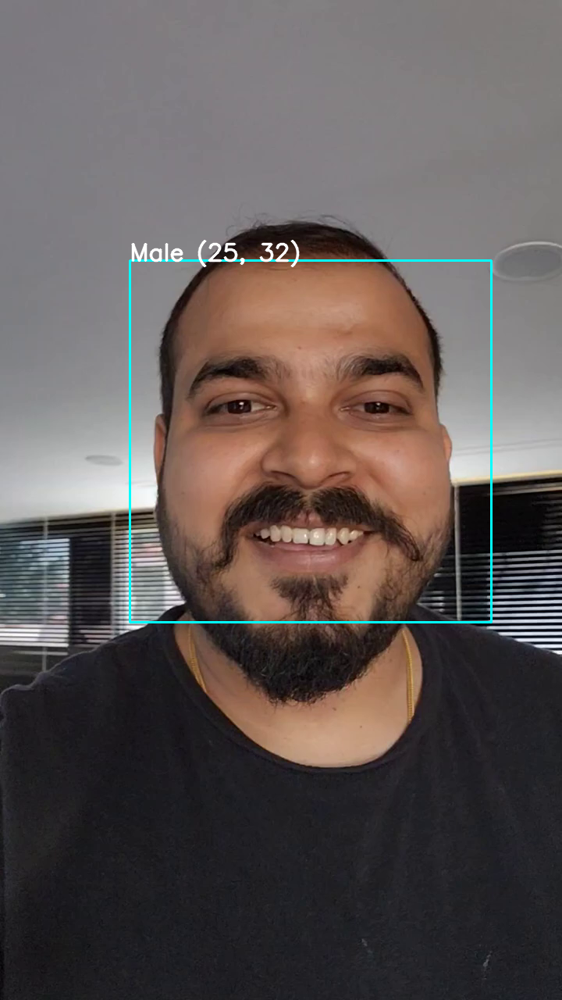

Found 1 faces
Gender: Male
Age Range: (4, 6)


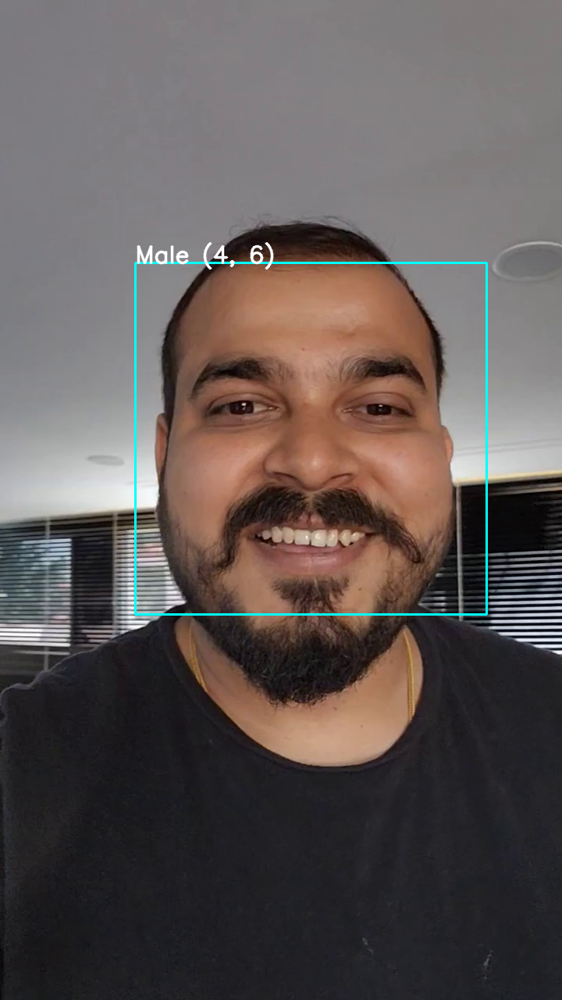

Found 1 faces
Gender: Male
Age Range: (8, 12)


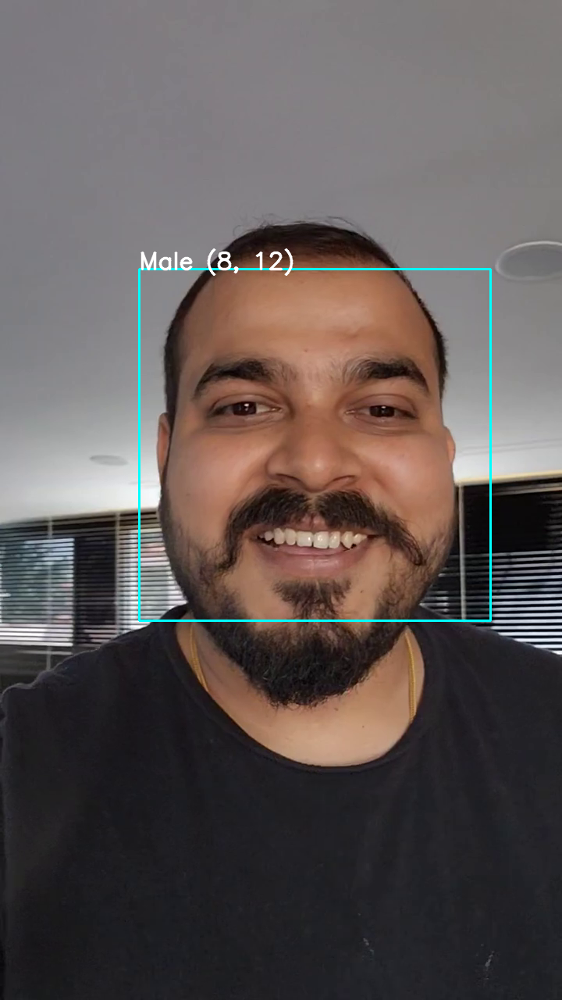

Found 1 faces
Gender: Male
Age Range: (25, 32)


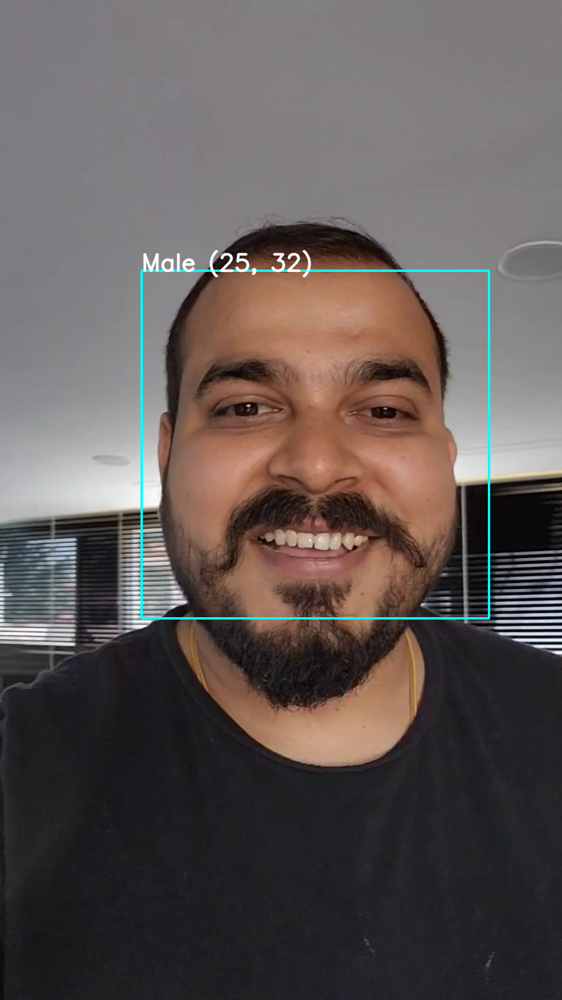

Found 1 faces
Gender: Male
Age Range: (25, 32)


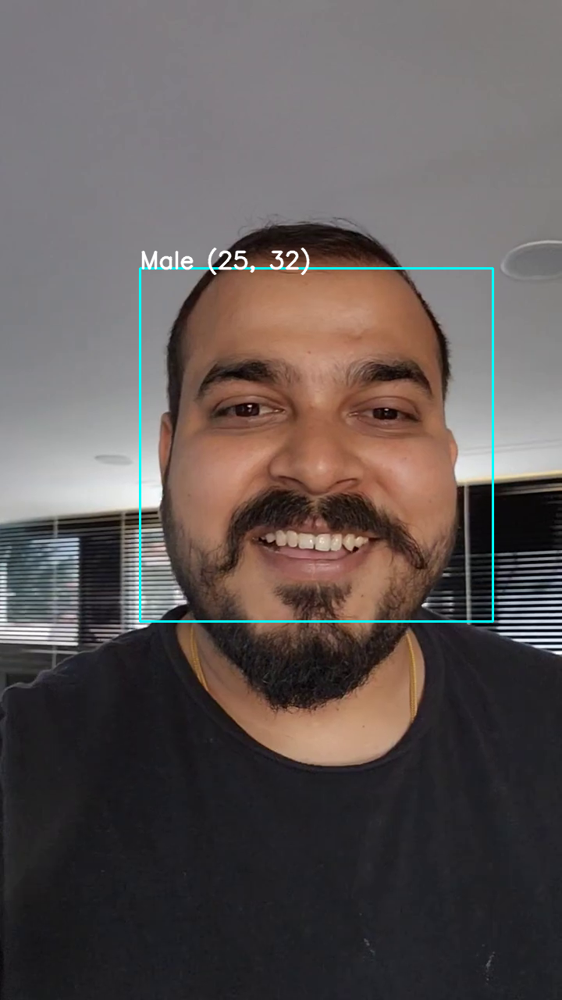

Found 1 faces
Gender: Male
Age Range: (4, 6)


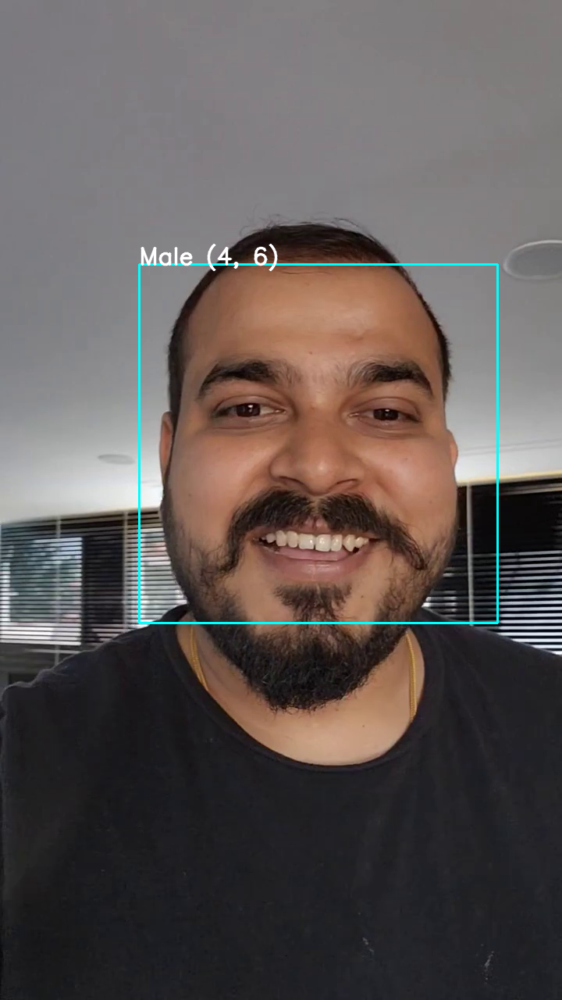

Found 1 faces
Gender: Male
Age Range: (4, 6)


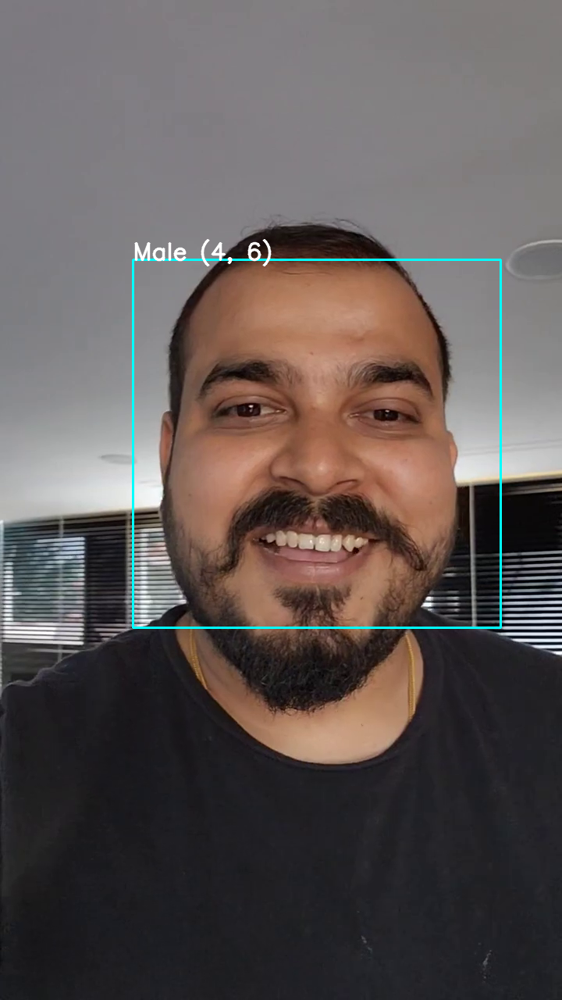

Found 1 faces
Gender: Male
Age Range: (0, 2)


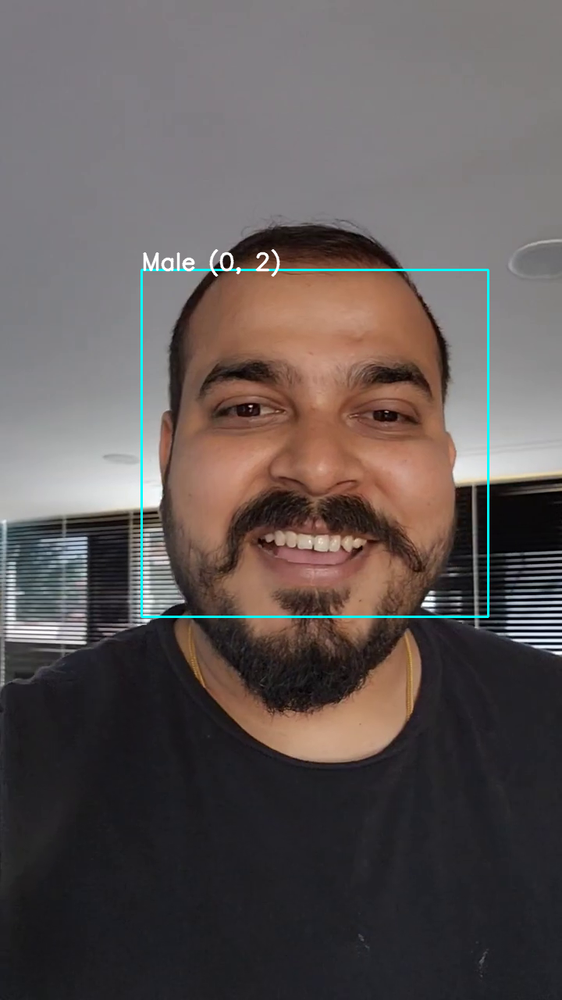

Found 1 faces
Gender: Male
Age Range: (25, 32)


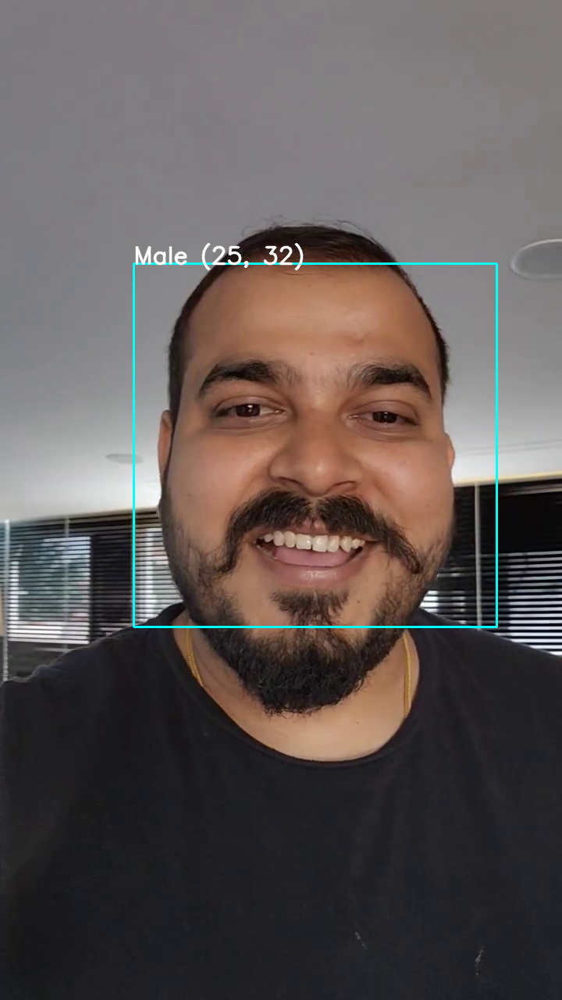

Found 1 faces
Gender: Male
Age Range: (25, 32)


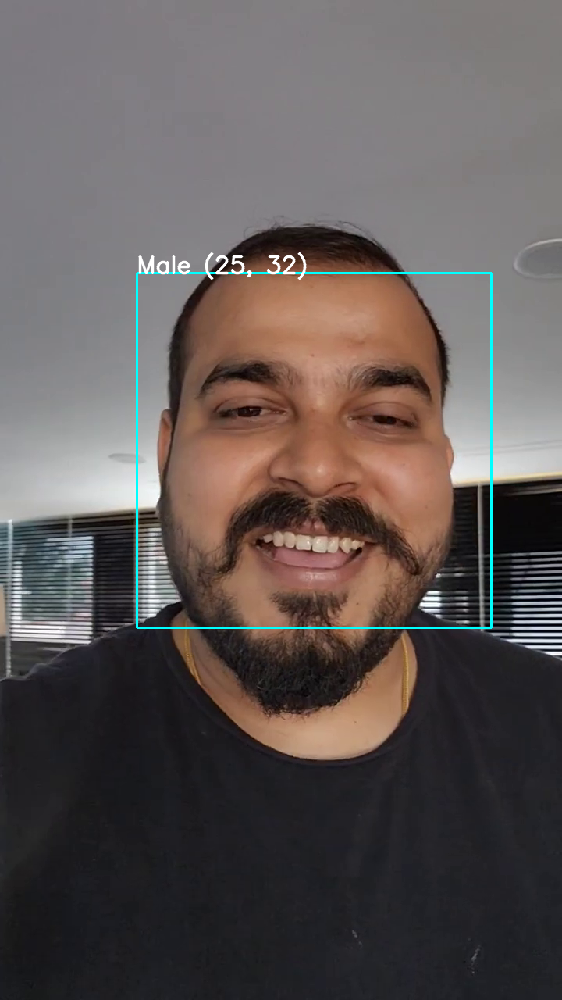

Found 1 faces
Gender: Male
Age Range: (25, 32)


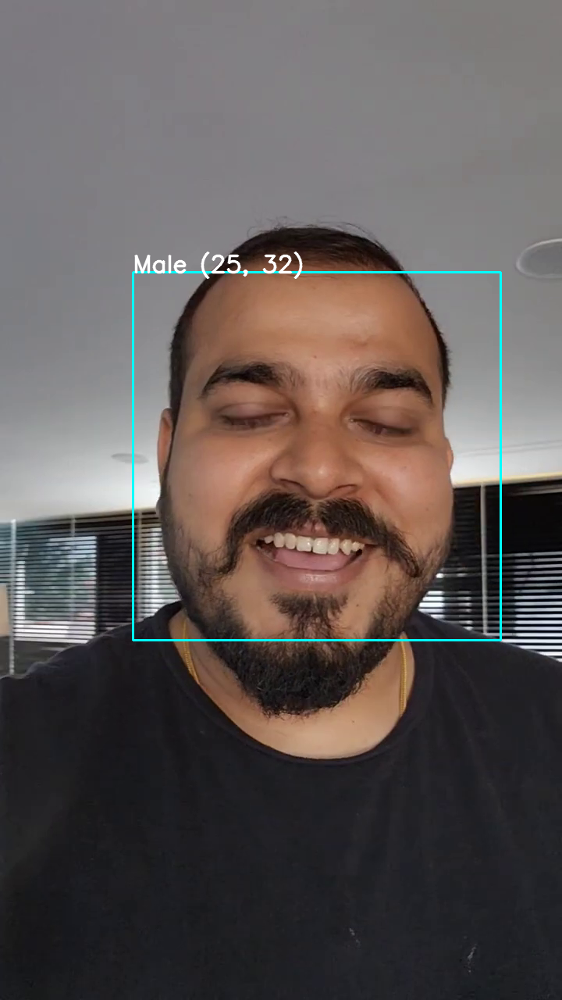

Found 1 faces
Gender: Male
Age Range: (25, 32)


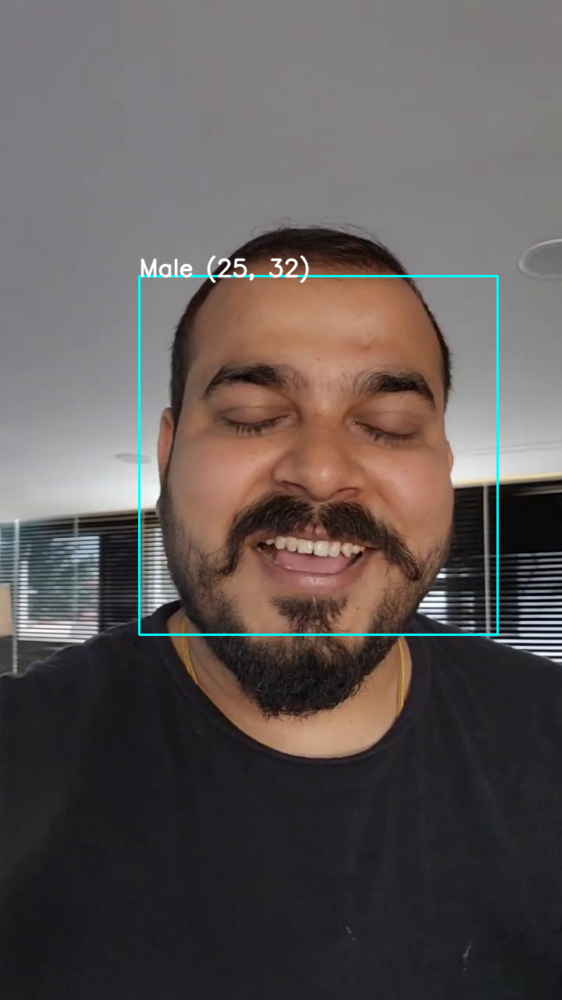

Found 1 faces
Gender: Male
Age Range: (25, 32)


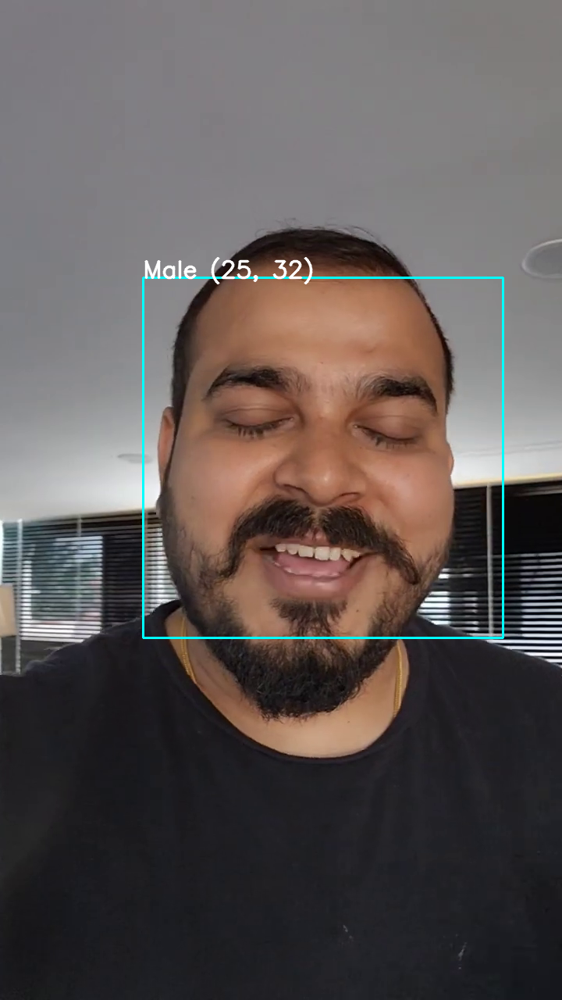

Found 1 faces
Gender: Male
Age Range: (25, 32)


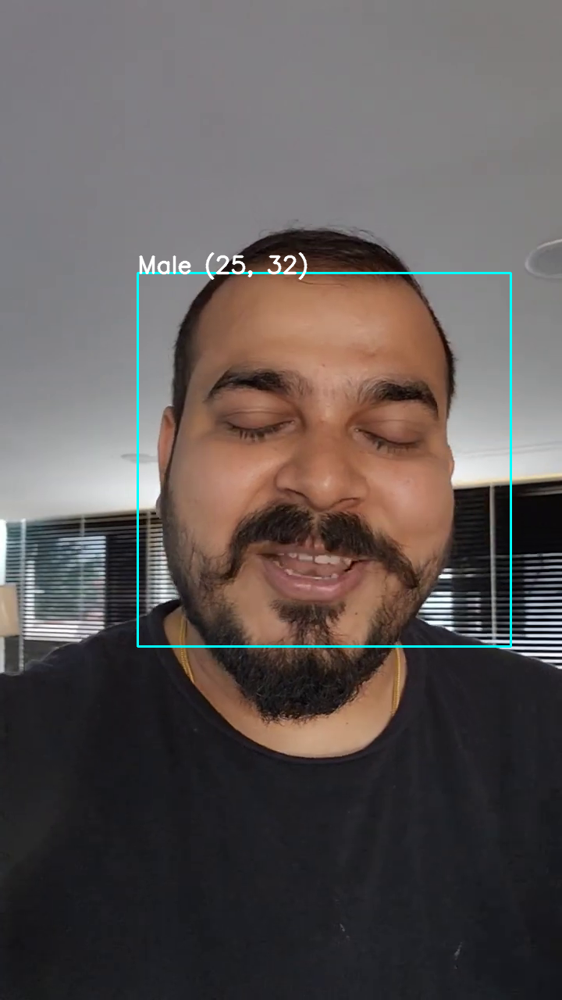

Found 1 faces
Gender: Male
Age Range: (25, 32)


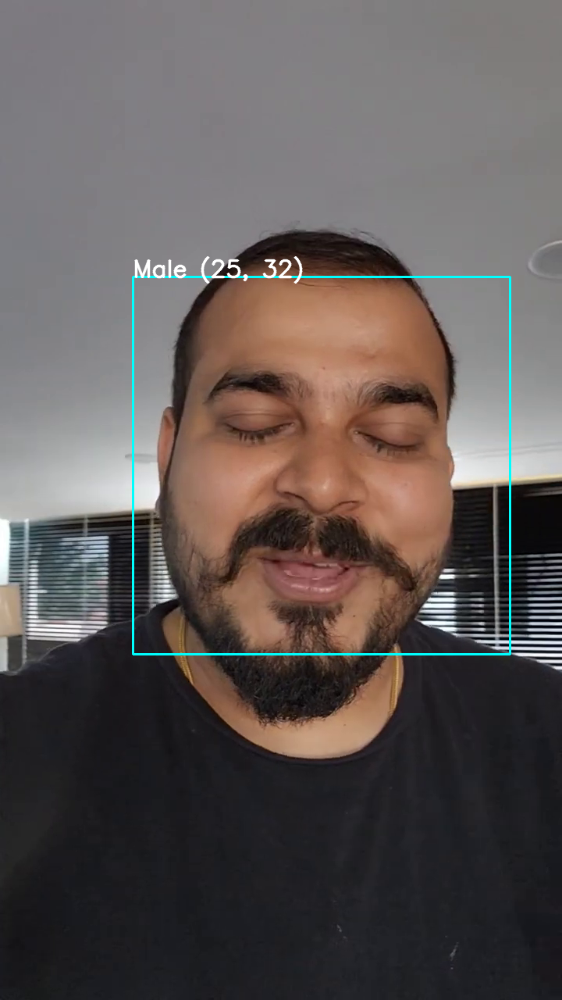

Found 1 faces
Gender: Male
Age Range: (25, 32)


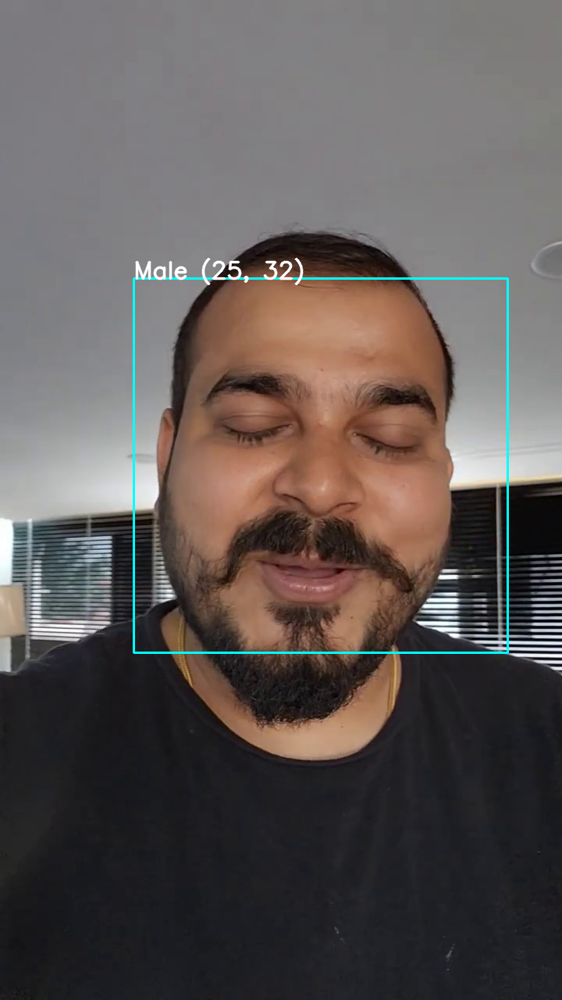

Found 1 faces
Gender: Male
Age Range: (25, 32)


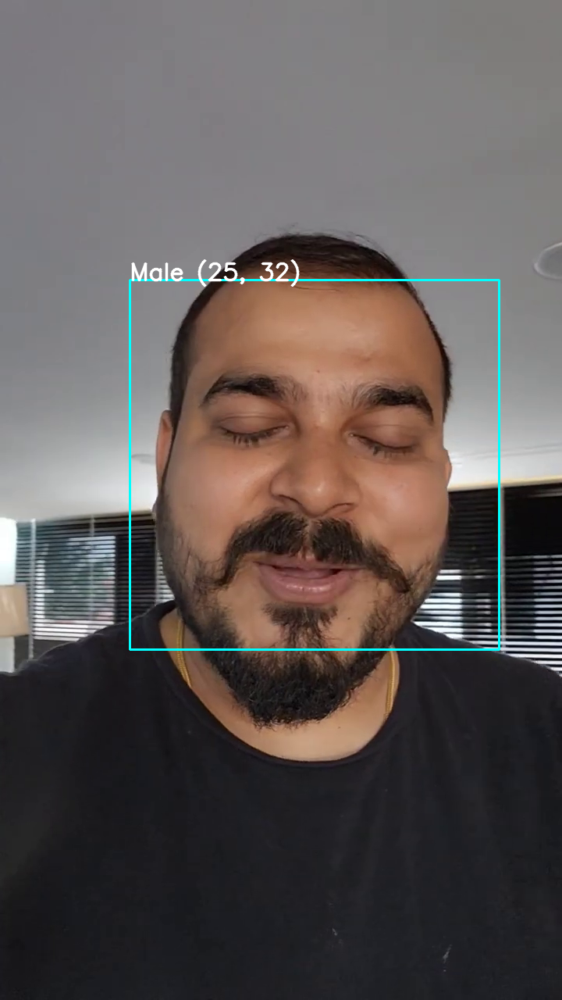

Found 1 faces
Gender: Male
Age Range: (25, 32)


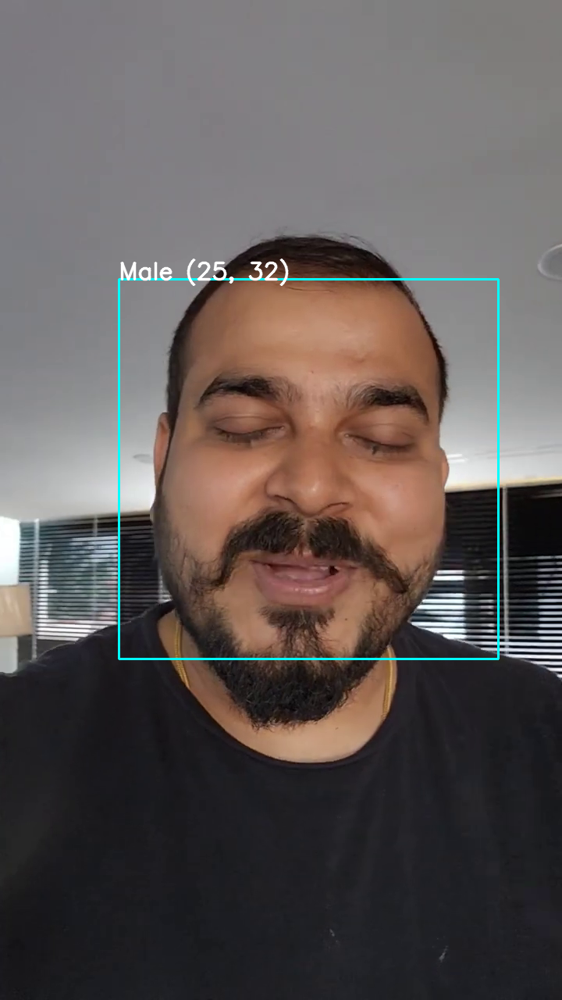

KeyboardInterrupt: 

In [11]:
if __name__ == "__main__":
  age_net, gender_net = load_caffe_models()
  video_detector(age_net, gender_net)